<a href="https://colab.research.google.com/github/tomynie/Projet-GPI-TomA/blob/main/GPI_Aydin_Tom_code_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# on installe les bibliotheques dont on a besoin si elles ne sont pas deja la
# biopython pour lire le PDB, mrcfile pour ouvrir la micrographie,
# gdown pour telecharger depuis Google Drive, scikit-image pour la NCC
!pip install biopython mrcfile gdown scikit-image

import os
import numpy as np
import matplotlib.pyplot as plt
import urllib.request
import mrcfile
import gdown
import collections

from skimage import transform, filters
from skimage.feature import match_template, peak_local_max
from skimage.transform import rotate
from Bio.PDB import PDBParser
import matplotlib.patches as patches

# seed fixe pour que les resultats soient reproductibles d une execution a l autre
np.random.seed(42)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 3.2 MB/s eta 0:00:00


Downloading...
From (original): https://drive.google.com/uc?id=1Qj30jSXcHEpkzE04cisbP6ljtnQ2Ausr
From (redirected): https://drive.google.com/uc?id=1Qj30jSXcHEpkzE04cisbP6ljtnQ2Ausr&confirm=t&uuid=dec27ebd-a6a9-4924-bf06-d83dfd495544
To: /content/map.mrc
100%|██████████| 228M/228M [00:02<00:00, 91.2MB/s]
/usr/local/lib/python3.12/dist-packages/mrcfile/mrcinterpreter.py:206: RuntimeWarning: Map ID string not found - not an MRC file, or file is corrupt
  warnings.warn(msg, RuntimeWarning)
/usr/local/lib/python3.12/dist-packages/mrcfile/mrcinterpreter.py:216: RuntimeWarning: Unrecognised machine stamp: 0x00 0x00 0x00 0x00
  warnings.warn(str(err), RuntimeWarning)


Image chargee : (7676, 7420), dtype=float32


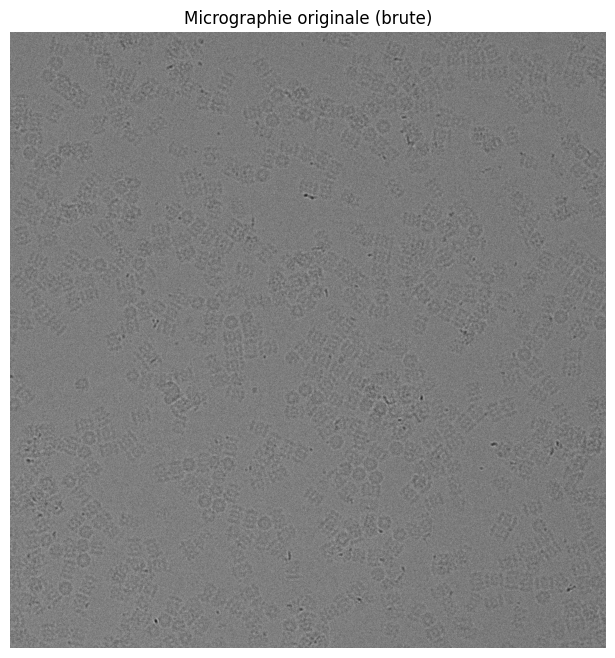

In [2]:
# on telecharge la micrographie depuis Google Drive
# le fichier est assez lourd donc ca peut prendre quelques secondes
file_id = '1Qj30jSXcHEpkzE04cisbP6ljtnQ2Ausr'
output_file = 'map.mrc'

# petite securite : si le fichier est la mais corrompu (taille < 1ko) on le supprime
if os.path.exists(output_file) and os.path.getsize(output_file) < 1000:
    os.remove(output_file)

if not os.path.exists(output_file):
    gdown.download(id=file_id, output=output_file, quiet=False, fuzzy=True)

with mrcfile.open(output_file, permissive=True) as mrc:
    raw_image = mrc.data.copy()

# squeeze pour passer de (1, H, W) a (H, W) si l image a une dimension en trop
image_2d = np.squeeze(raw_image)
print(f'Image chargee : {image_2d.shape}, dtype={image_2d.dtype}')

# on utilise les percentiles 5-95 pour l affichage pour eviter que
# quelques pixels extremes n ecrasent tout le contraste
vmin, vmax = np.percentile(image_2d, [5, 95])
plt.figure(figsize=(8, 8))
plt.imshow(image_2d, cmap='gray', vmin=vmin, vmax=vmax)
plt.title('Micrographie originale (brute)')
plt.axis('off')
plt.show()

étape 1 :

1- bining

-> Application du binning x4...
Taille avant : (7676, 7420)
Pixel size avant : 0.66 A/px
Taille apres : (1919, 1855)
Pixel size apres : 2.64 A/px  (0.66 x 4)


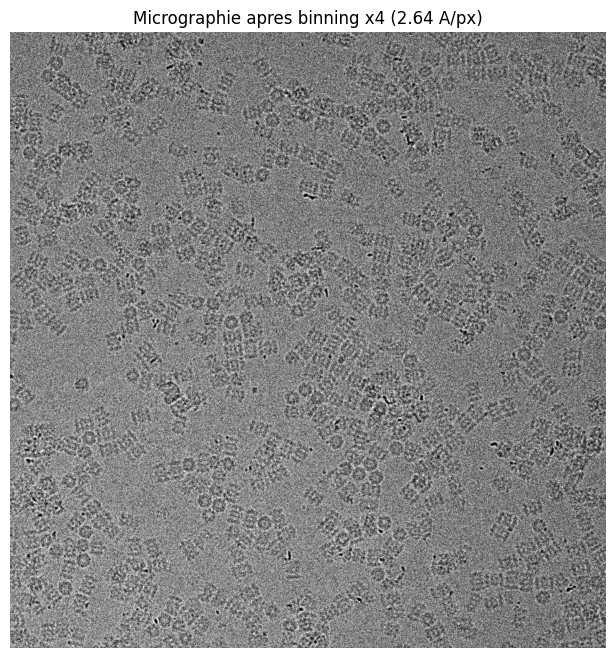

In [3]:
# ==========================================
# 1.1 Binning
# ==========================================

# le pixel size brut du microscope est de 0.66 A/px, ce qui donne
# des images tres grandes et tres lourdes a traiter.
# on applique un binning x4 pour regrouper les pixels par blocs de 4x4,
# ce qui reduit la taille de l image et monte le pixel size a 2.64 A/px.
# c est important que ce pixel size corresponde exactement a celui
# qu on utilisera pour generer le template, sinon la proteine sera
# a la mauvaise echelle et la NCC ne pourra rien trouver.
bin_factor = 4
print(f'-> Application du binning x{bin_factor}...')
print(f'Taille avant : {image_2d.shape}')
print(f'Pixel size avant : 0.66 A/px')

# downscale_local_mean fait la moyenne des blocs -> moins de bruit que de juste
# garder 1 pixel sur 4 (ce serait de l aliasing)
img_binned = transform.downscale_local_mean(image_2d, (bin_factor, bin_factor))

pixel_size_image = 0.66 * bin_factor
print(f'Taille apres : {img_binned.shape}')
print(f'Pixel size apres : {pixel_size_image} A/px  (0.66 x {bin_factor})')

vmin, vmax = np.percentile(img_binned, [5, 95])
plt.figure(figsize=(8, 8))
plt.imshow(img_binned, cmap='gray', vmin=vmin, vmax=vmax)
plt.title(f'Micrographie apres binning x{bin_factor} ({pixel_size_image} A/px)')
plt.axis('off')
plt.show()

2: Normalize the image

-> Normalisation Z-score...
Avant - Moyenne: 16.03, Ecart-type: 1.08
Apres - Moyenne: 0.00, Ecart-type: 1.00


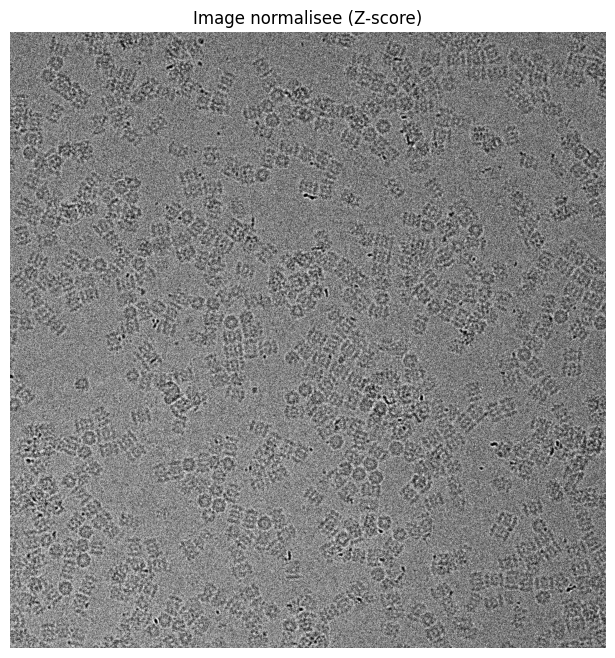

In [4]:
# ==========================================
# 1.2 Normalisation
# ==========================================

# on normalise l image avec un Z-score (moyenne=0, ecart-type=1)
# c est une etape obligatoire avant la NCC : si l image n est pas normalisee,
# les scores de correlation dependent de l intensite absolue des pixels
# et non de la ressemblance avec le template
print('-> Normalisation Z-score...')

mean_before = np.mean(img_binned)
std_before = np.std(img_binned)
print(f'Avant - Moyenne: {mean_before:.2f}, Ecart-type: {std_before:.2f}')

img_norm = (img_binned - mean_before) / std_before

print(f'Apres - Moyenne: {img_norm.mean():.2f}, Ecart-type: {img_norm.std():.2f}')

vmin, vmax = np.percentile(img_norm, [5, 95])
plt.figure(figsize=(8, 8))
plt.imshow(img_norm, cmap='gray', vmin=vmin, vmax=vmax)
plt.title('Image normalisee (Z-score)')
plt.axis('off')
plt.show()

3: Padding

-> Padding de 100px de chaque cote...
Avant: (1919, 1855) -> Apres: (2119, 2055)


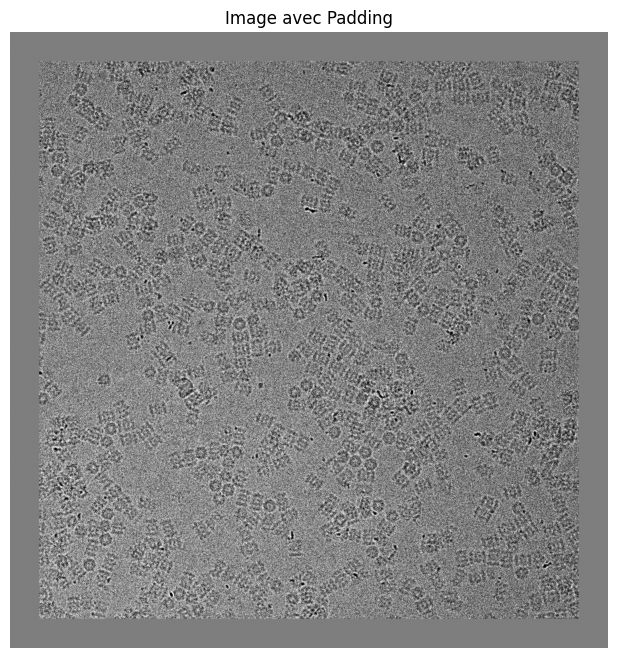

In [5]:
# ==========================================
# 1.3 Padding
# ==========================================

# quand match_template glisse le template sur les bords de l image,
# il n a plus assez de contexte -> ca genere des faux scores eleves sur les bords.
# on ajoute donc une bordure de zeros tout autour.
# comme l image est en Z-score (moyenne=0), des zeros = fond neutre,
# la transition est propre sans artefact
pad_size = 100
print(f'-> Padding de {pad_size}px de chaque cote...')

img_padded = np.pad(img_norm, pad_width=pad_size, mode='constant', constant_values=0)

print(f'Avant: {img_norm.shape} -> Apres: {img_padded.shape}')

vmin, vmax = np.percentile(img_padded, [5, 95])
plt.figure(figsize=(8, 8))
plt.imshow(img_padded, cmap='gray', vmin=vmin, vmax=vmax)
plt.title('Image avec Padding')
plt.axis('off')
plt.show()

Chek the image format that the cc function accepts

In [6]:
# match_template de scikit-image exige du float32
# si l image est en float64 (ce qui peut arriver apres le Z-score),
# la NCC plante ou donne des resultats incorrects -> on force la conversion
print(f'Dimensions: {img_padded.ndim}D, shape: {img_padded.shape}')
print(f'Type actuel: {img_padded.dtype}')

img_final = img_padded.astype(np.float32)

print(f'Type apres conversion: {img_final.dtype}')
print('=> Etape 1 terminee !')

Dimensions: 2D, shape: (2119, 2055)
Type actuel: float32
Type apres conversion: float32
=> Etape 1 terminee !


optional : denoise (filtrer), crop the image to make a test image

Taille image de test : (512, 512)


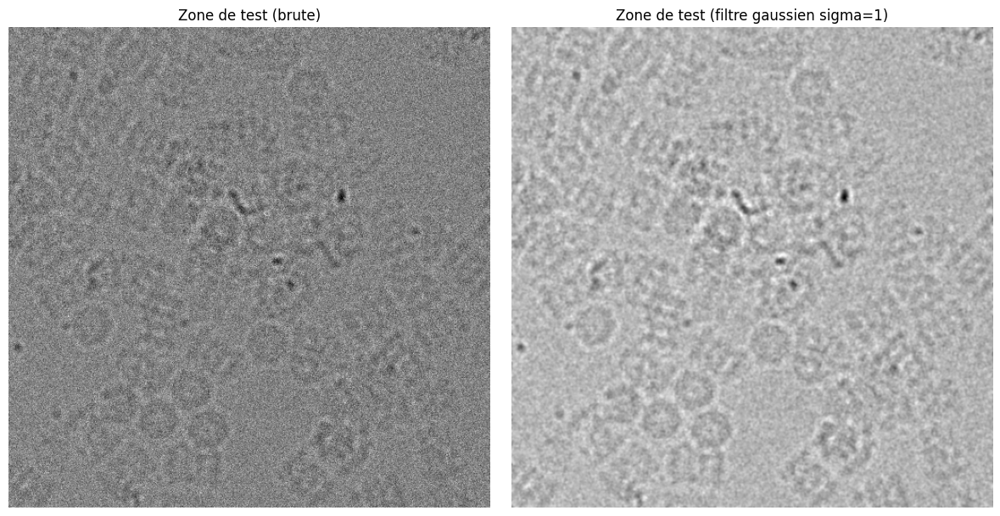

In [7]:
# on cree une image de test en croppant le centre de la micrographie (512x512 px)
# ca sert juste a visualiser et verifier que le pipeline fonctionne
# sur une petite zone avant de lancer sur toute l image
h, w = img_final.shape
start_y, start_x = h // 2, w // 2
img_test_raw = img_final[start_y:start_y + 512, start_x:start_x + 512]

# on applique un leger filtre gaussien pour reduire le bruit haute frequence
# sigma=1 c est assez doux pour ne pas flouter les contours des particules
img_test = filters.gaussian(img_test_raw, sigma=1).astype(np.float32)

print(f'Taille image de test : {img_test.shape}')

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img_test_raw, cmap='gray')
axes[0].set_title('Zone de test (brute)')
axes[0].axis('off')
axes[1].imshow(img_test, cmap='gray')
axes[1].set_title('Zone de test (filtre gaussien sigma=1)')
axes[1].axis('off')
plt.tight_layout()
plt.show()

étape 2 : Prepare the template



1- Import the pdb



In [8]:
# ==========================================
# 2.1 Import du modele PDB
# ==========================================
# le fichier PDB contient les coordonnees 3D de chaque atome
# on le recupere directement depuis la banque de donnees RCSB
# Pour changer le fichier PDB il faut juste remplacé le code de la catégorie pdb_id
pdb_id = '6BDF'
pdb_file = f'{pdb_id}.pdb'

if not os.path.exists(pdb_file):
    url = f'https://files.rcsb.org/download/{pdb_id}.pdb'
    urllib.request.urlretrieve(url, pdb_file)
    print('Telechargement OK')
else:
    print('Fichier PDB deja present.')

parser = PDBParser(QUIET=True)
structure = parser.get_structure(pdb_id, pdb_file)

nb_atomes = len(list(structure.get_atoms()))
print(f'Structure {pdb_id} chargee : {nb_atomes} atomes')

Telechargement OK
Structure 6BDF chargee : 46382 atomes


2- Make projections (check pixel sixe (if px size matches the dimensions will match just need to choose box size in which particle will fit), normalization, image format)

### Justification du pixel size

Le pixel size est une valeur cle pour que le template soit a la bonne echelle par rapport a la micrographie.

| Parametre | Valeur |
|---|---|
| Pixel size initial (donne par le microscope) | 0.66 A/px |
| Facteur de binning applique | x 4 |
| **Pixel size final utilise** | **0.66 x 4 = 2.64 A/px** |

Si le pixel size du template ne correspond pas a celui de la micrographie,
la proteine apparaitra trop grande ou trop petite dans le template,
et la NCC ne pourra pas la detecter correctement.
Un binning x4 permet aussi de reduire le bruit et d accelerer les calculs.

Dimensions proteines : X=119.7 Y=121.3 Z=164.9 A
Box size calcule : 74 px (195.4 A)
Template : (74, 74), min=0.000, max=1.000


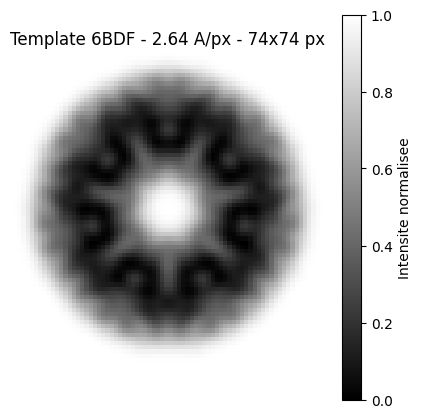

In [9]:
# ==========================================
# 2.2 Projection 2D du modele (template)
# ==========================================

# on recupere les coordonnees XYZ de tous les atomes et on les centre
coords = np.array([atom.get_coord() for atom in structure.get_atoms()])
coords -= coords.mean(axis=0)

pixel_size = 2.64  # doit correspondre exactement au pixel size de l image
padding_nombre = 5  # marge de 5 Angstroms autour de la proteine

# on calcule la taille de boite depuis les vraies dimensions de la proteine
# + 20% de marge pour que la proteine soit bien centree sans etre coupee
dimensions = coords.max(axis=0) - coords.min(axis=0)
box_size = int(dimensions.max() / pixel_size * 1.2)
if box_size % 2 != 0:
    box_size += 1  # on force un nombre pair, plus pratique pour centrer
print(f'Dimensions proteines : X={dimensions[0]:.1f} Y={dimensions[1]:.1f} Z={dimensions[2]:.1f} A')
print(f'Box size calcule : {box_size} px ({box_size * pixel_size:.1f} A)')

def create_projection(coord1, coord2, bins=box_size, padding=padding_nombre):
    min1, max1 = coord1.min() - padding, coord1.max() + padding
    min2, max2 = coord2.min() - padding, coord2.max() + padding
    H, _, _ = np.histogram2d(coord1, coord2, bins=bins,
                              range=[[min1, max1], [min2, max2]])
    # Z-score : les bins vides (fond) passent negatifs, les zones denses restent positives
    H = H - H.mean()
    if H.std() > 0:
        H = H / H.std()
    # inversion du contraste : en cryo-EM les particules sont sombres sur fond clair
    # notre histogramme a des atomes brillants -> on inverse pour coller a la realite
    H = -H
    # lissage pour simuler la resolution limitee du microscope
    # sans ca le template ressemble a un nuage de points, pas a une vraie particule
    H = filters.gaussian(H, sigma=1.5)
    # on remet en [0,1] pour l affichage et la NCC
    H = (H - H.min()) / (H.max() - H.min())
    return H.astype('float32')

# on projette selon l axe XY (vue du dessus) -> c est cette vue qu on utilise pour la NCC
template_final = create_projection(coords[:, 0], coords[:, 1])

print(f'Template : {template_final.shape}, min={template_final.min():.3f}, max={template_final.max():.3f}')

plt.figure(figsize=(5, 5))
plt.imshow(template_final, cmap='gray', origin='lower')
plt.title(f'Template 6BDF - {pixel_size} A/px - {box_size}x{box_size} px')
plt.colorbar(label='Intensite normalisee')
plt.axis('off')
plt.show()

Projection du template sous differents angles (XY, XZ, YZ)

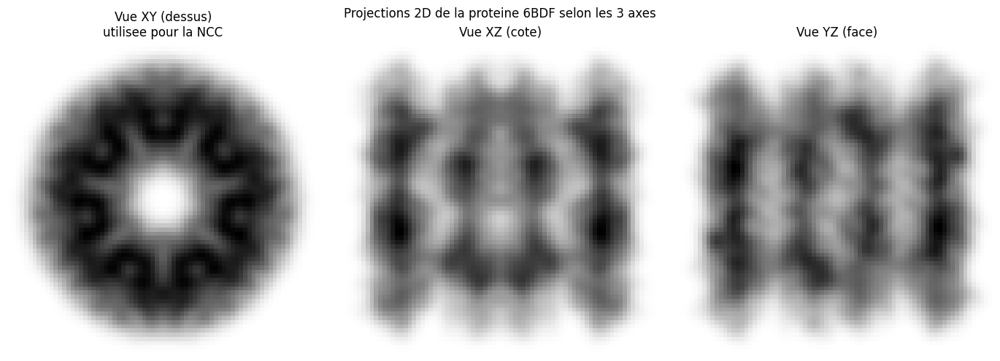

Les 3 vues montrent que la proteine peut paraitre differente
selon son orientation dans la micrographie.
La recherche angulaire (etape 3.2) gere ces variations d orientation.


In [11]:
# on projette la proteine selon les 3 plans pour voir sa forme sous differents angles
# ca nous montre que 6BDF n est pas une sphere parfaite :
# selon l orientation dans la glace, elle peut paraitre differente dans la micrographie
# c est pour ca qu on fait une recherche angulaire a l etape 3.2
proj_xy = create_projection(coords[:, 0], coords[:, 1])
proj_xz = create_projection(coords[:, 0], coords[:, 2])
proj_yz = create_projection(coords[:, 1], coords[:, 2])

fig, axes = plt.subplots(1, 3, figsize=(14, 5))

axes[0].imshow(proj_xy, cmap='gray', origin='lower')
axes[0].set_title('Vue XY (dessus)\nutilisee pour la NCC')
axes[0].axis('off')

axes[1].imshow(proj_xz, cmap='gray', origin='lower')
axes[1].set_title('Vue XZ (cote)')
axes[1].axis('off')

axes[2].imshow(proj_yz, cmap='gray', origin='lower')
axes[2].set_title('Vue YZ (face)')
axes[2].axis('off')

plt.suptitle('Projections 2D de la proteine 6BDF selon les 3 axes', fontsize=12)
plt.tight_layout()
plt.show()

print('Les 3 vues montrent que la proteine peut paraitre differente')
print('selon son orientation dans la micrographie.')
print('La recherche angulaire (etape 3.2) gere ces variations d orientation.')

Bonus- add noise

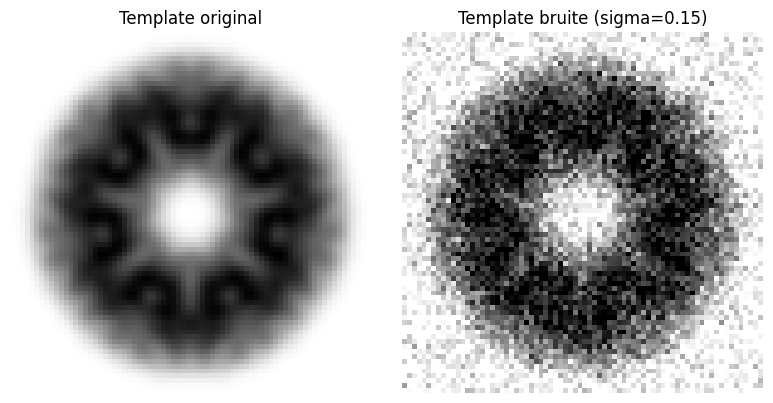

template_pour_ncc pret : mean=-0.000, std=1.000


In [12]:
# en cryo-EM le rapport signal/bruit est tres faible
# on ajoute un bruit gaussien sur le template pour simuler ces conditions
# et verifier que notre pipeline reste robuste meme avec un template bruite
niveau_de_bruit = 0.15
bruit = np.random.normal(0.0, niveau_de_bruit, size=template_final.shape)
template_bruit = np.clip(template_final + bruit, 0, 1).astype('float32')

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(template_final, cmap='gray', origin='lower')
axes[0].set_title('Template original')
axes[0].axis('off')
axes[1].imshow(template_bruit, cmap='gray', origin='lower')
axes[1].set_title(f'Template bruite (sigma={niveau_de_bruit})')
axes[1].axis('off')
plt.tight_layout()
plt.show()

# on prepare le template pour la NCC : Z-score pour que la correlation
# soit bien normalisee et independante de l intensite absolue des pixels
t_mean = np.mean(template_final)
t_std = np.std(template_final)
template_pour_ncc = ((template_final - t_mean) / (t_std + 1e-10)).astype('float32')
print(f'template_pour_ncc pret : mean={template_pour_ncc.mean():.3f}, std={template_pour_ncc.std():.3f}')

étape 3 : NCC



1-Optimize the shift.


-> Calcul de la NCC...
NCC terminee. Min=-0.148, Max=0.153
175 particules candidates (min_distance=37px, seuil=0.55)


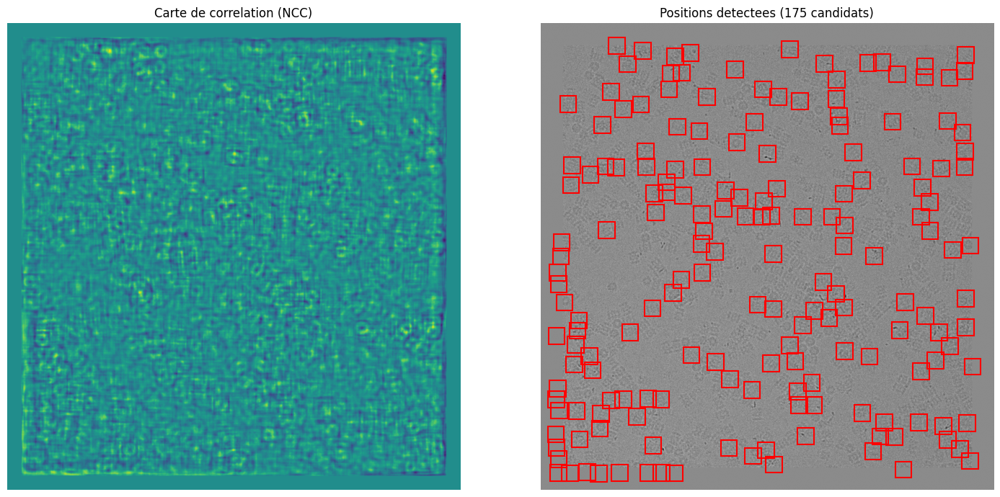

In [13]:
# ==========================================
# 3. NCC - Normalized Cross-Correlation
# ==========================================

# match_template fait glisser le template sur toute l image pixel par pixel
# et calcule un score de correlation entre -1 et 1 a chaque position
# un score proche de 1 signifie que la zone ressemble au template
# en cryo-EM on depasse rarement 0.3-0.4 a cause du bruit, c est normal
image_cible = img_final

print('-> Calcul de la NCC...')
resultat_ncc = match_template(image_cible, template_pour_ncc, pad_input=True)
print(f'NCC terminee. Min={resultat_ncc.min():.3f}, Max={resultat_ncc.max():.3f}')

# peak_local_max detecte les maxima locaux dans la carte de correlation
# min_distance = moitie de la boite pour ne pas detecter deux fois la meme particule
# threshold_rel = on garde seulement les pics a au moins 55% du score maximum
min_dist = template_pour_ncc.shape[0] // 2
coordonnees_pics = peak_local_max(resultat_ncc, min_distance=min_dist, threshold_rel=0.55)
print(f'{len(coordonnees_pics)} particules candidates (min_distance={min_dist}px, seuil=0.55)')

fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(resultat_ncc, cmap='viridis')
axes[0].set_title('Carte de correlation (NCC)')
axes[0].axis('off')

h_t, w_t = template_pour_ncc.shape
axes[1].imshow(image_cible, cmap='gray')
axes[1].set_title(f'Positions detectees ({len(coordonnees_pics)} candidats)')
axes[1].axis('off')
for y, x in coordonnees_pics:
    rect = patches.Rectangle(
        (x - w_t // 2, y - h_t // 2), w_t, h_t,
        linewidth=1.5, edgecolor='red', facecolor='none')
    axes[1].add_patch(rect)

plt.tight_layout()
plt.show()

2- optimize the threshold

-> carte_max_ncc non definie, utilisation de la NCC simple.


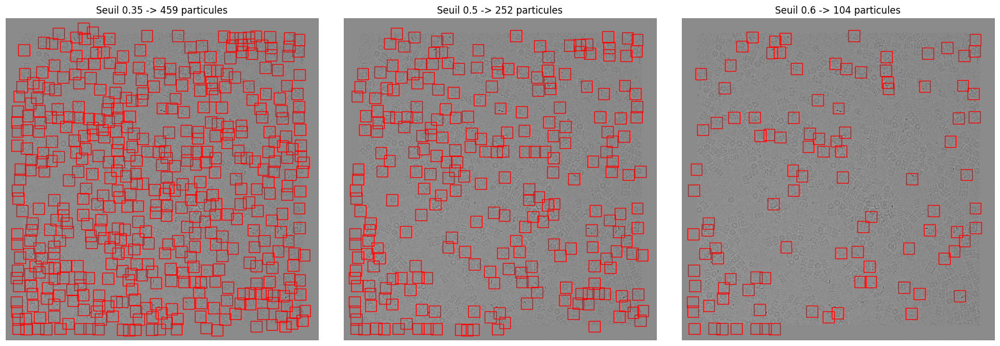

Seuil retenu : 0.55 -> 175 particules


In [14]:
# ==========================================
# 3.1 Optimisation du seuil
# ==========================================

# le choix du seuil est un compromis : trop bas on detecte du bruit,
# trop haut on rate des vraies particules.
# on affiche 3 valeurs cote a cote pour choisir visuellement le meilleur
try:
    source_donnees = carte_max_ncc
    print('-> Utilisation de la carte angulaire (etape 3.2)')
except NameError:
    source_donnees = resultat_ncc
    print('-> carte_max_ncc non definie, utilisation de la NCC simple.')

seuils = [0.35, 0.5, 0.6]
h_t, w_t = template_pour_ncc.shape
min_dist = h_t // 2

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, seuil in enumerate(seuils):
    pics = peak_local_max(source_donnees, min_distance=min_dist, threshold_rel=seuil)
    axes[i].imshow(img_final, cmap='gray')
    axes[i].set_title(f'Seuil {seuil} -> {len(pics)} particules')
    axes[i].axis('off')
    for y, x in pics:
        rect = patches.Rectangle(
            (x - w_t / 2, y - h_t / 2), w_t, h_t,
            linewidth=1, edgecolor='red', facecolor='none')
        axes[i].add_patch(rect)

plt.tight_layout()
plt.show()

# 0.55 donne le meilleur equilibre sur cette micrographie
seuil_optimal = 0.55
pics_finaux = peak_local_max(source_donnees, min_distance=min_dist, threshold_rel=seuil_optimal)
print(f'Seuil retenu : {seuil_optimal} -> {len(pics_finaux)} particules')

3- optimize if working with side view optimize the angle step

-> Recherche angulaire : 24 angles, pas de 15 deg
Scores NCC : min=-0.107, max=0.154
-> 280 particules detectees (seuil=0.55, bords exclus)


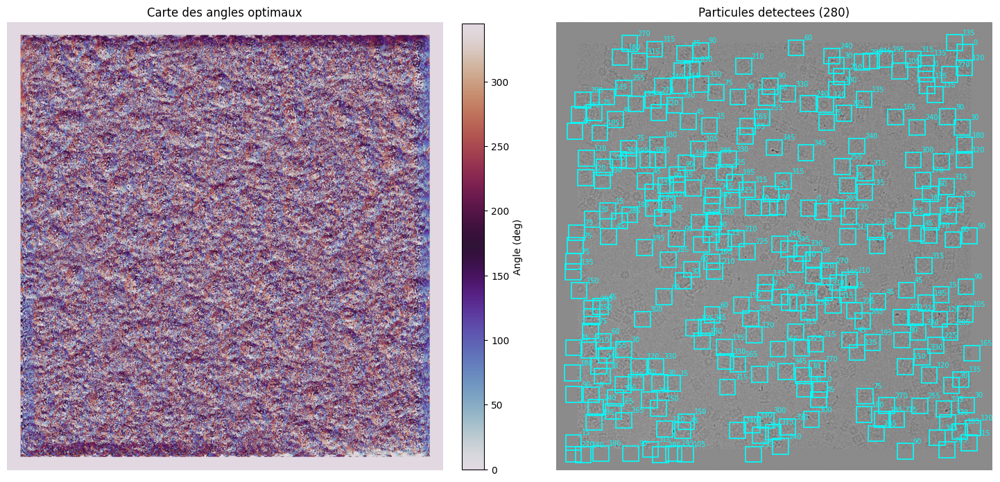

In [15]:
# ==========================================
# 3.2 NCC avec recherche angulaire
# ==========================================

# les proteines dans la glace peuvent etre orientees dans n importe quel sens
# une NCC simple avec un seul template rate toutes les particules qui sont tournees
# on fait donc tourner le template de 0 a 360 deg par pas de 15 deg (24 orientations)
# et on garde pour chaque pixel le meilleur score obtenu parmi tous les angles
image_cible = img_final
template_a_tourner = template_pour_ncc

angle_step = 15
angles = np.arange(0, 360, angle_step)
# on initialise a -1 pour capturer meme les scores negatifs si besoin
carte_max_ncc = np.full_like(image_cible, fill_value=-1.0, dtype=np.float32)
carte_angles = np.zeros_like(image_cible, dtype=np.float32)

print(f'-> Recherche angulaire : {len(angles)} angles, pas de {angle_step} deg')

for angle in angles:
    temp_rot = rotate(template_a_tourner, angle, resize=False)
    ncc_angle = match_template(image_cible, temp_rot, pad_input=True)
    masque = ncc_angle > carte_max_ncc
    carte_max_ncc[masque] = ncc_angle[masque]
    carte_angles[masque] = angle  # on memorise l angle qui a donne le meilleur score

print(f'Scores NCC : min={carte_max_ncc.min():.3f}, max={carte_max_ncc.max():.3f}')

min_dist = template_a_tourner.shape[0] // 2
seuil = 0.55
pics_bruts = peak_local_max(carte_max_ncc, min_distance=min_dist, threshold_rel=seuil)

# on retire les detections dans la zone de padding et sur les bords
# ces positions n ont pas assez de contexte image et generent des faux positifs
marge_bord = h_t
H_img, W_img = image_cible.shape
pics_orientes = np.array([(y, x) for y, x in pics_bruts
                           if marge_bord < y < H_img - marge_bord
                           and marge_bord < x < W_img - marge_bord])
if len(pics_orientes) == 0:
    pics_orientes = np.empty((0, 2), dtype=int)
print(f'-> {len(pics_orientes)} particules detectees (seuil={seuil}, bords exclus)')

fig, axes = plt.subplots(1, 2, figsize=(15, 7))
im = axes[0].imshow(carte_angles, cmap='twilight')
axes[0].set_title('Carte des angles optimaux')
axes[0].axis('off')
plt.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04, label='Angle (deg)')

axes[1].imshow(image_cible, cmap='gray')
axes[1].set_title(f'Particules detectees ({len(pics_orientes)})')
axes[1].axis('off')

h_t, w_t = template_a_tourner.shape
for y, x in pics_orientes:
    rect = patches.Rectangle(
        (x - w_t / 2, y - h_t / 2), w_t, h_t,
        linewidth=1.2, edgecolor='cyan', facecolor='none')
    axes[1].add_patch(rect)
    axes[1].text(x + w_t / 2, y - h_t / 2,
                 f'{int(carte_angles[y, x])}', color='cyan', fontsize=7)

plt.tight_layout()
plt.show()

### Bilan quantitatif de la detection

In [16]:
# bilan quantitatif de la detection :
# on regarde les scores NCC des particules detectees et la repartition des angles
# si les angles sont bien distribues sur 0-360 c est bon signe,
# ca veut dire qu on detecte des particules dans toutes les orientations
scores = [carte_max_ncc[y, x] for y, x in pics_orientes]
print(f'Particules detectees : {len(pics_orientes)}')
print(f'Score NCC moyen : {sum(scores)/len(scores):.3f}')
print(f'Score NCC max   : {max(scores):.3f}')
print(f'Score NCC min   : {min(scores):.3f}')

pixel_size = 2.64
h_t, w_t = template_pour_ncc.shape
print(f'\nBoite : {h_t}x{w_t} px = {h_t*pixel_size:.0f}x{w_t*pixel_size:.0f} Angstroms')

print('\nDistribution des angles :')
comptage = collections.Counter([int(carte_angles[y, x]) for y, x in pics_orientes])
for angle, count in sorted(comptage.items()):
    print(f'  {angle:3d} deg : {count} particule(s)')

Particules detectees : 280
Score NCC moyen : 0.101
Score NCC max   : 0.154
Score NCC min   : 0.085

Boite : 74x74 px = 195x195 Angstroms

Distribution des angles :
    0 deg : 10 particule(s)
   15 deg : 11 particule(s)
   30 deg : 12 particule(s)
   45 deg : 13 particule(s)
   60 deg : 14 particule(s)
   75 deg : 11 particule(s)
   90 deg : 13 particule(s)
  105 deg : 8 particule(s)
  120 deg : 16 particule(s)
  135 deg : 17 particule(s)
  150 deg : 9 particule(s)
  165 deg : 10 particule(s)
  180 deg : 8 particule(s)
  195 deg : 13 particule(s)
  210 deg : 6 particule(s)
  225 deg : 8 particule(s)
  240 deg : 16 particule(s)
  255 deg : 9 particule(s)
  270 deg : 10 particule(s)
  285 deg : 11 particule(s)
  300 deg : 8 particule(s)
  315 deg : 17 particule(s)
  330 deg : 20 particule(s)
  345 deg : 10 particule(s)


etape 4 : Extract the particles

-> Utilisation des positions de la recherche angulaire
Boite : 74x74px | 280 candidats
280 particules extraites (0 rejetees, trop pres du bord)
Meilleure particule : #1 (score NCC = 0.154)


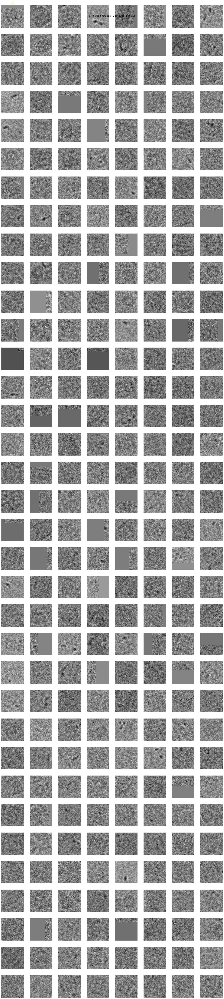

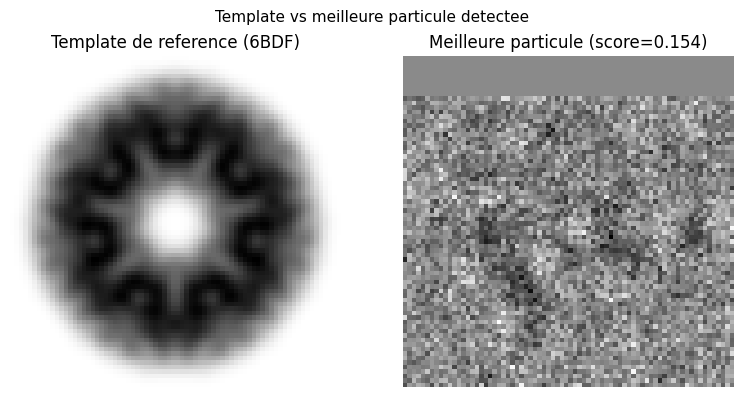

=> 280 particules extraites avec succes !


In [17]:
# ==========================================
# 4. Extraction des particules
# ==========================================

# on decoupe une boite carree centree sur chaque position detectee
# la taille de la boite correspond exactement a celle du template
try:
    coordonnees_finales = pics_orientes
    scores_finaux = [carte_max_ncc[y, x] for y, x in coordonnees_finales]
    print('-> Utilisation des positions de la recherche angulaire')
except NameError:
    coordonnees_finales = pics_finaux
    scores_finaux = [resultat_ncc[y, x] for y, x in coordonnees_finales]
    print('-> Utilisation des positions NCC simple')

h_box, w_box = template_pour_ncc.shape
image_source = img_final
print(f'Boite : {h_box}x{w_box}px | {len(coordonnees_finales)} candidats')

particules = []
scores_extraits = []
for (y, x), score in zip(coordonnees_finales, scores_finaux):
    y1, y2 = int(y - h_box // 2), int(y + h_box // 2)
    x1, x2 = int(x - w_box // 2), int(x + w_box // 2)
    # on ignore les particules qui depassent du cadre de l image
    if y1 < 0 or x1 < 0 or y2 > image_source.shape[0] or x2 > image_source.shape[1]:
        continue
    particules.append(image_source[y1:y2, x1:x2].copy())
    scores_extraits.append(score)

n = len(particules)
print(f'{n} particules extraites ({len(coordonnees_finales)-n} rejetees, trop pres du bord)')

if n > 0:
    # la meilleure particule est celle avec le score NCC le plus eleve
    idx_best = int(np.argmax(scores_extraits))
    meilleure_particule = particules[idx_best]
    print(f'Meilleure particule : #{idx_best+1} (score NCC = {scores_extraits[idx_best]:.3f})')

    cols = min(8, n)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

    if rows == 1 and cols == 1:
        axes = [[axes]]
    elif rows == 1:
        axes = [list(axes)]
    elif cols == 1:
        axes = [[ax] for ax in axes]

    for idx in range(rows * cols):
        ax = axes[idx // cols][idx % cols]
        if idx < n:
            ax.imshow(particules[idx], cmap='gray')
            titre = f'#{idx+1}\n{scores_extraits[idx]:.2f}'
            couleur = 'gold' if idx == idx_best else 'white'
            ax.set_title(titre, fontsize=7, color=couleur)
        ax.axis('off')

    plt.suptitle(f'Particules extraites - {n} au total (6BDF)', fontsize=12)
    plt.tight_layout()
    plt.show()

    # comparaison template vs meilleure particule
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(template_final, cmap='gray', origin='lower')
    axes[0].set_title('Template de reference (6BDF)')
    axes[0].axis('off')
    axes[1].imshow(meilleure_particule, cmap='gray')
    axes[1].set_title(f'Meilleure particule (score={scores_extraits[idx_best]:.3f})')
    axes[1].axis('off')
    plt.suptitle('Template vs meilleure particule detectee', fontsize=11)
    plt.tight_layout()
    plt.show()
    print(f'=> {n} particules extraites avec succes !')
else:
    print('Aucune particule extraite, verifier les seuils')

### Particules extraites : image moyenne

280 particules utilisees pour la moyenne


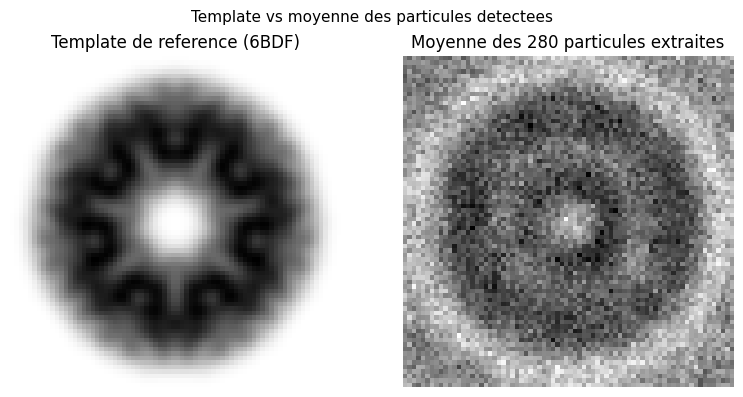

In [18]:
# on calcule la moyenne de toutes les particules extraites
# si le picking est correct, la moyenne doit faire ressortir la forme
# de la proteine car le signal se renforce et le bruit aleatoire s annule
if len(particules) > 0:
    taille_ref = particules[0].shape
    # on garde seulement les particules de la meme taille (securite)
    particules_ok = [p for p in particules if p.shape == taille_ref]

    moyenne_particules = np.mean(np.stack(particules_ok, axis=0), axis=0)

    print(f'{len(particules_ok)} particules utilisees pour la moyenne')

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(template_final, cmap='gray', origin='lower')
    axes[0].set_title('Template de reference (6BDF)')
    axes[0].axis('off')
    axes[1].imshow(moyenne_particules, cmap='gray')
    axes[1].set_title(f'Moyenne des {len(particules_ok)} particules extraites')
    axes[1].axis('off')

    plt.suptitle('Template vs moyenne des particules detectees', fontsize=11)
    plt.tight_layout()
    plt.show()
else:
    print('Pas de particules disponibles.')

### Conclusion

## Conclusion

Dans ce projet, nous avons implemente un pipeline complet de **template matching** pour detecter et extraire des particules proteiques dans une micrographie de cryo-microscopie electronique.

### Ce que nous avons fait

1. **Preprocessing** : binning (x4), normalisation Z-score, padding et denoising pour preparer la micrographie.
2. **Template** : generation d'une projection 2D du modele atomique 6BDF (PDB) par histogramme, avec normalisation Z-score et pixel size coherent (2.64 A/px).
3. **NCC** : calcul de la Normalized Cross-Correlation avec recherche angulaire (0-360 deg, pas de 15 deg) pour detecter les particules independamment de leur orientation.
4. **Extraction** : decoupage de chaque particule detectee dans une boite centree sur les coordonnees NCC.

### Limites de notre approche

- La projection 2D par histogramme est une approximation : elle ne simule pas le contraste de phase (CTF) du microscope.
- Le bruit de fond de la micrographie reelle est plus complexe qu'un simple bruit gaussien.
- En pratique, des logiciels comme **RELION** ou **crYOLO** utilisent des approches beaucoup plus sophistiquees (deep learning, correction CTF, classification 2D/3D...).

Malgre ces limitations, notre pipeline permet d'identifier automatiquement les positions candidates de la proteine 6BDF dans la micrographie, ce qui est l'objectif premier du particle picking en cryo-EM.